In [2]:
import infercnvpy as cnv

import scanpy as sc
import pandas as pd
import infercnvpy as cnv
import numpy as np 

import sys
import os
sys.path.append("/home/augusta/storage3/augusta/insituCNV/InSituCNV")
from insitucnv import *
import insitucnv as icv

import spatialdata as sd
from spatialdata_io import xenium
import spatialdata_plot

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
sc.settings.verbosity = 3   # 0: error, 1: warn, 2: info, 3: hint
import squidpy as sq

/home/augusta/anaconda3/envs/insitucnv_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Set default figure size globally for matplotlib (width, height in inches)
plt.rcParams['figure.figsize'] = (30, 30)  # Adjust as needed

# Load the data

In [4]:
adata = sc.read_h5ad("/home/augusta/storage3/augusta/insituCNV/InSituCNV/Breast_cancer_Xenium5K/00_Preprocessing/data/all_samples_preprocessed_celltype_annot.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 167264 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'leiden', 'cell.id', 'cell_type_oct25', 'compartment'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cell_type_oct25_colors', 'compartment_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'log_norm', 'raw_counts'
    obsp: 'co

In [6]:
set(adata.obs['cell_type_oct25'].unique())

{'Adipocytes',
 'B_cells',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Myeloid',
 'PVLs',
 'Plasma',
 'T_cells'}

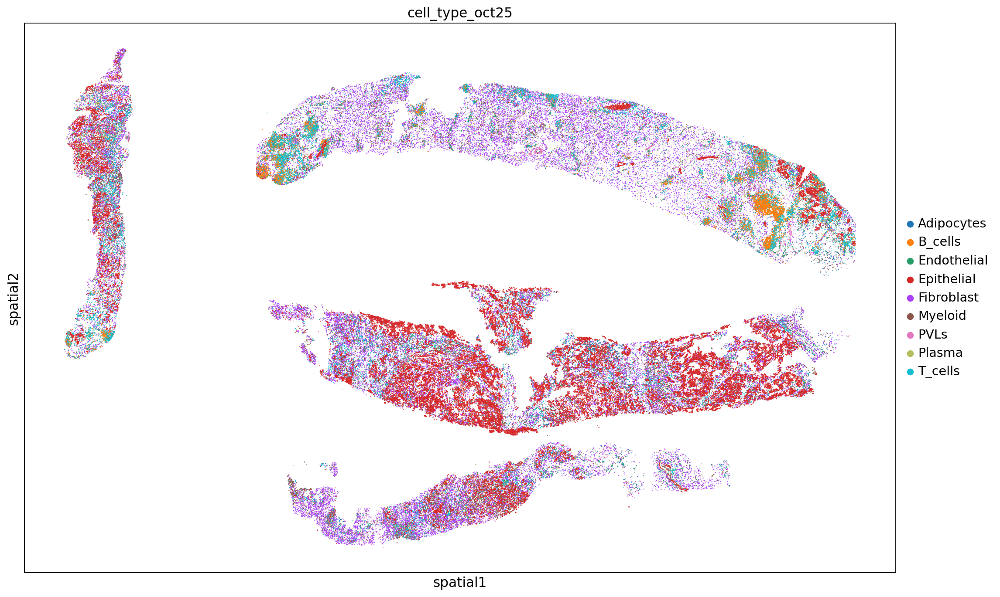

In [6]:
sc.pl.spatial(adata, color='cell_type_oct25',spot_size =15)

In [12]:
reference_key = 'cell_type_oct25'
reference_cat = ["T_cells", "B_cells", "Myeloid", "Plasma","Fibroblast", "Endothelial", "Adipocytes", "PVLs"]

In [8]:
adata.obs['sample'].unique()

['1105_BL', '1105_K2', '1310_BL', '1310_V2']
Categories (4, object): ['1105_BL', '1105_K2', '1310_BL', '1310_V2']

In [7]:
adata_1105_BL = adata[adata.obs['sample'] == '1105_BL'].copy()

In [ ]:
#adata_1105_BL.write("/home/augusta/storage3/augusta/insitucnv/InSituCNV/Breast_cancer_Xenium5K/01_InSituCNV/data/1105_BL.h5ad", compression ="gzip")
#print("Saved 1105_BL as .h5ad")
#adata_1105_K2.write("/home/augusta/storage3/augusta/insitucnv/InSituCNV/Breast_cancer_Xenium5K/01_InSituCNV/data/1105_K2.h5ad", compression ="gzip")
#print("Saved 1105_K2 as .h5ad")
#adata_1310_BL.write("/home/augusta/storage3/augusta/insitucnv/InSituCNV/Breast_cancer_Xenium5K/01_InSituCNV/data/1310_BL.h5ad", compression ="gzip")
#print("Saved 1310_BL as .h5ad")
#adata_1310_V2.write("/home/augusta/storage3/augusta/insitucnv/InSituCNV/Breast_cancer_Xenium5K/01_InSituCNV/data/1310_V2.h5ad", compression ="gzip")
#print("Saved 1310_V2 as .h5ad")

# inferCNV (1105_BL)

## Smooth the data

In [8]:
# Normalize the raw counts
adata_1105_BL.X = adata_1105_BL.layers['raw_counts'].copy()
sc.pp.normalize_total(adata_1105_BL, target_sum=1e4)

# Apply smoothing on 100 nearest neighbors
adata_1105_BL.layers['norm'] = adata_1105_BL.X.copy()
icv.tl.smooth_data_for_cnv(adata_1105_BL, layer_w_norm_counts = 'norm', n_neighbors=100)

# Normalize and log-transform the smoothed data
adata_1105_BL.X = adata_1105_BL.layers['M'].copy()
sc.pp.normalize_total(adata_1105_BL, target_sum=1e4)
sc.pp.log1p(adata_1105_BL)

normalizing counts per cell
    finished (0:00:00)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
normalizing counts per cell
    finished (0:00:00)


In [9]:
adata_1105_BL

AnnData object with n_obs × n_vars = 19413 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'leiden', 'cell.id', 'cell_type_oct25', 'compartment'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cell_type_oct25_colors', 'compartment_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'log_norm', 'raw_counts', 'norm', 'M'
 

## Add genomic positions

In [10]:
adata_1105_BL = icv.pp.add_genomic_positions(adata_1105_BL)

Added genomic positions and ids to 5090 genes, out of 5099 genes in total!


## inferCNV (normal cells as reference)

In [13]:
cnv.tl.infercnv(adata_1105_BL, 
                window_size =60,
                step=10,
                lfc_clip = 4,
                reference_key = reference_key,
                reference_cat = reference_cat,
                chunksize = 1000,
                calculate_gene_values = True)

100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [01:15<00:00,  3.77s/it]


In [14]:
cnv.tl.pca(adata_1105_BL)
cnv.pp.neighbors(adata_1105_BL)

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:26)


In [15]:
adata

AnnData object with n_obs × n_vars = 167264 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'leiden', 'cell.id', 'cell_type_oct25', 'compartment'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cell_type_oct25_colors', 'compartment_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'log_norm', 'raw_counts'
    obsp: 'co

leiden res 0.1
running Leiden clustering
    finished: found 3 clusters and added
    'cnv_leiden_res0.1', the cluster labels (adata.obs, categorical) (0:00:06)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cnv_leiden_res0.1']`
heatmap
categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


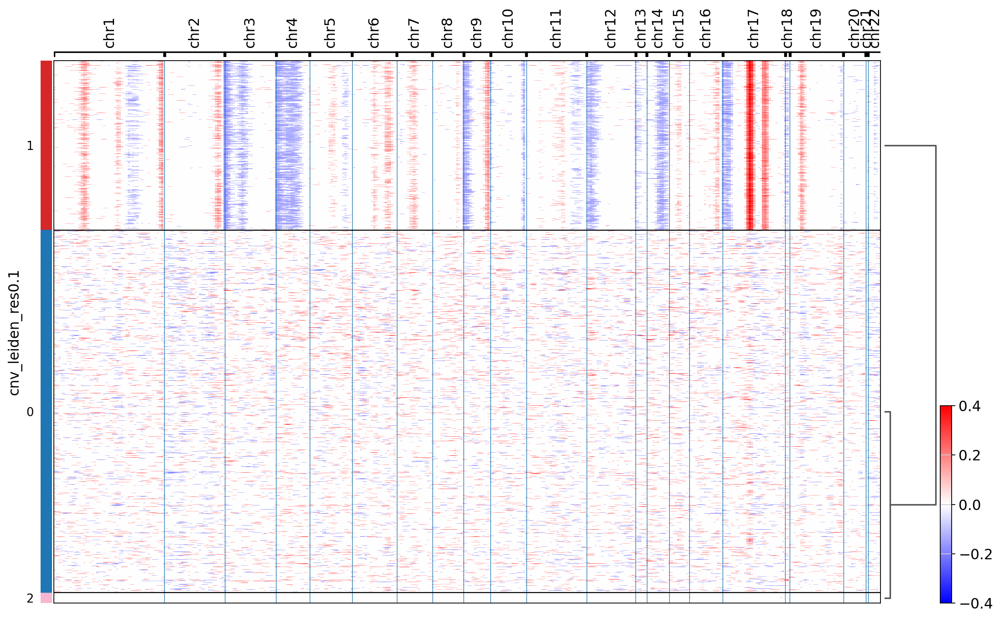

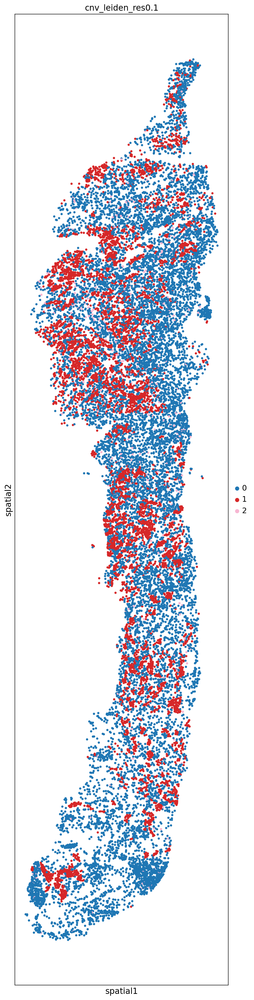

In [16]:
from matplotlib import cm
from matplotlib.colors import to_hex

resolutions = [0.1]

for res in resolutions:
    print('leiden res', res)
    key_added = f'cnv_leiden_res{res}'
    color_key = f'{key_added}_colors'

    # Run Leiden clustering
    cnv.tl.leiden(adata_1105_BL, resolution=res, key_added=key_added)

    # Remove old colors if they exist to avoid mismatch issues
    if color_key in adata_1105_BL.uns:
        del adata_1105_BL.uns[color_key]

    # Optional: regenerate color palette (recommended)
    n = adata_1105_BL.obs[key_added].nunique()
    adata_1105_BL.uns[color_key] = [to_hex(cm.tab20(i / n)) for i in range(n)]

    sc.tl.dendrogram(adata_1105_BL, groupby=key_added)
    
    # Plot CNV heatmap
    print('heatmap')
    #save_heatmap = f"_{key_added}_1105_BL.svg"
    cnv.pl.chromosome_heatmap(adata_1105_BL, dendrogram = True, groupby=key_added, save=None, vmax=.4, vmin=-.4)  # save=None, dendrogram=True

    # Plot spatial
    sc.pl.spatial(adata_1105_BL, color=key_added, spot_size=15)

categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


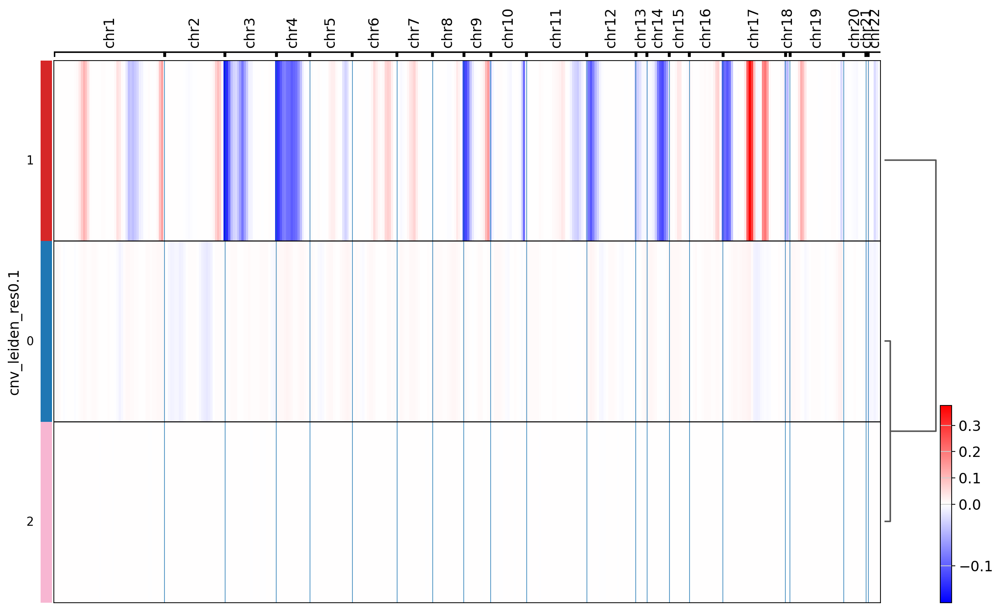

In [35]:
cnv.pl.chromosome_heatmap_summary(adata_1105_BL, groupby='cnv_leiden_res0.1', dendrogram = True)

In [55]:
import pandas as pd

df = pd.crosstab(
    adata_1105_BL.obs['cnv_leiden_res0.1'],
    adata_1105_BL.obs['cell_type_oct25']
)

df

cell_type_oct25,Adipocytes,B_cells,Endothelial,Epithelial,Fibroblast,Myeloid,PVLs,Plasma,T_cells
cnv_leiden_res0.1,,,,,,,,,
0,42,611,872,92,4119,2289,790,664,3500
1,2,7,2,5964,7,60,9,4,11
2,1,7,54,0,166,11,7,64,58


In [56]:
df_prop = pd.crosstab(
    adata_1105_BL.obs['cnv_leiden_res0.1'],
    adata_1105_BL.obs['cell_type_oct25'],
    normalize='index'
)

df_prop

cell_type_oct25,Adipocytes,B_cells,Endothelial,Epithelial,Fibroblast,Myeloid,PVLs,Plasma,T_cells
cnv_leiden_res0.1,,,,,,,,,
0,0.003236,0.047076,0.067185,0.007088,0.317359,0.176362,0.060868,0.051160,0.269666
1,0.000330,0.001154,0.000330,0.983185,0.001154,0.009891,0.001484,0.000659,0.001813
2,0.002717,0.019022,0.146739,0.000000,0.451087,0.029891,0.019022,0.173913,0.157609


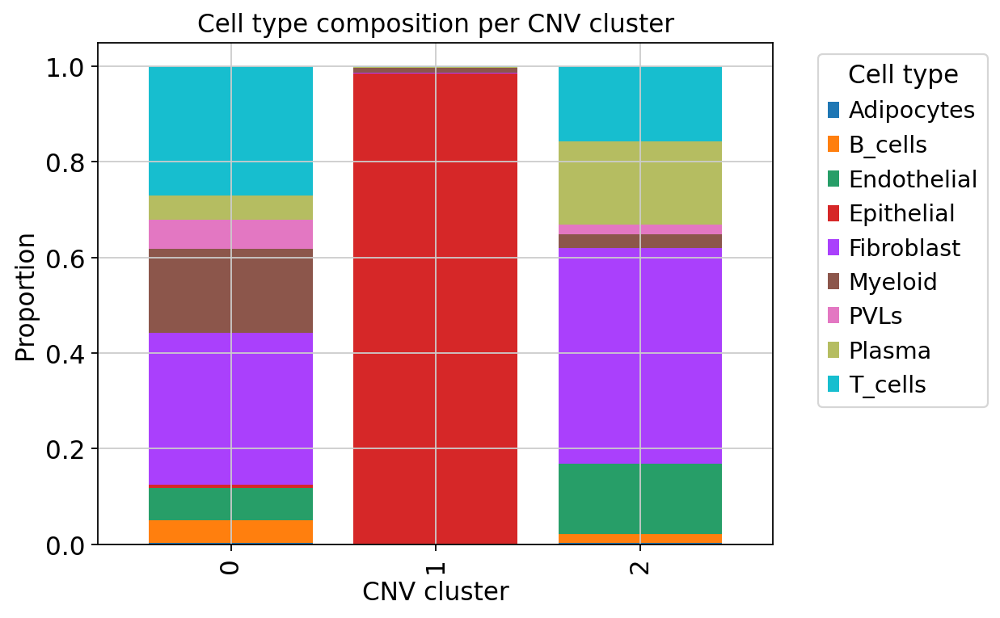

In [103]:
import matplotlib.pyplot as plt

# Proportions table
df_prop = pd.crosstab(
    adata_1105_BL.obs['cnv_leiden_res0.1'],
    adata_1105_BL.obs['cell_type_oct25'],
    normalize='index'
)

# Get cell type order and matching colors from AnnData
celltypes = adata_1105_BL.obs['cell_type_oct25'].cat.categories
colors = adata_1105_BL.uns['cell_type_oct25_colors']

# Keep only columns present in df_prop and preserve order
celltypes_present = [ct for ct in celltypes if ct in df_prop.columns]
color_dict = dict(zip(celltypes, colors))
plot_colors = [color_dict[ct] for ct in celltypes_present]

# Reorder columns
df_prop = df_prop[celltypes_present]

# Plot
ax = df_prop.plot(
    kind='bar',
    stacked=True,
    figsize=(8, 5),
    color=plot_colors,
    width=0.8
)

ax.set_ylabel("Proportion")
ax.set_xlabel("CNV cluster")
ax.set_title("Cell type composition per CNV cluster")

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    title='Cell type'
)

plt.tight_layout()
plt.savefig("cnv_leiden_res0.1_celltype_comp_per_cluster.svg")
plt.show()

In [110]:
adata_1105_BL.uns["cnv_leiden_res0.1_colors"] = [
    "#3064bf",  # normal 1
    "#FF7F0E", #tumor cluster
    "#42f5ef"   # normal 2
]

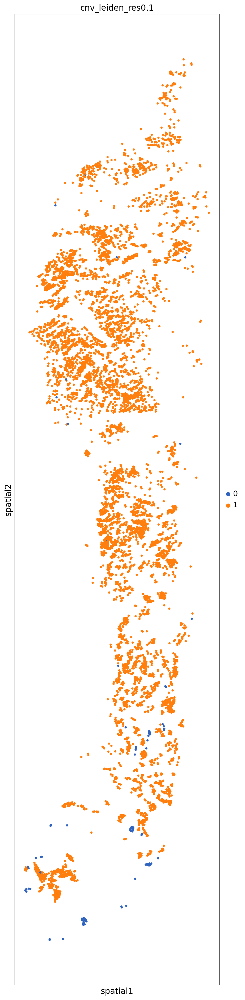

In [111]:
sc.pl.spatial(adata_1105_BL[adata_1105_BL.obs['cell_type_oct25'] == 'Epithelial'], color='cnv_leiden_res0.1', spot_size=15, save="cnv_leiden_res0.1_1105BL_epicells.png")

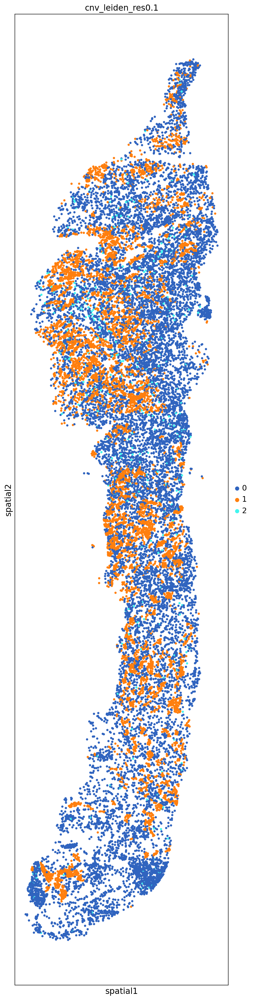

In [112]:
sc.pl.spatial(adata_1105_BL, color='cnv_leiden_res0.1', spot_size=15, save="cnv_leiden_res0.1_1105BL_allcells.png")

categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


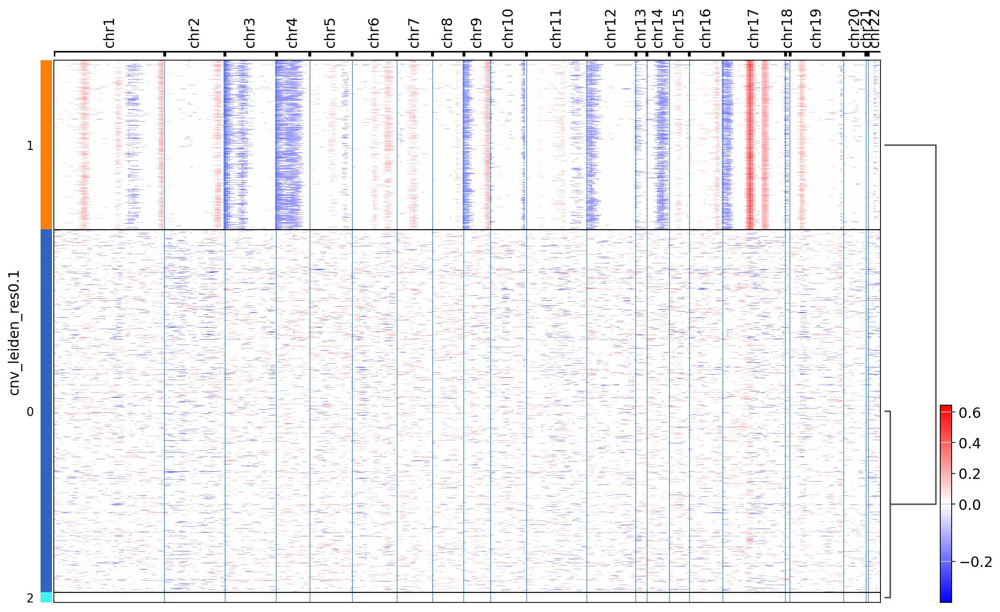

In [113]:
cnv.pl.chromosome_heatmap(adata_1105_BL, groupby='cnv_leiden_res0.1', dendrogram = True, save="new_cnv_leiden_res0.1_1105BL.svg")

In [59]:
# Initialize all cells as non-epi
adata_1105_BL.obs["epi_annotation"] = "non-epi"

# Tumor epithelial
tumor_mask = (
    (adata_1105_BL.obs["cell_type_oct25"] == "Epithelial") &
    (adata_1105_BL.obs["cnv_leiden_res0.1"] == "1")
)

adata_1105_BL.obs.loc[tumor_mask, "epi_annotation"] = "tumor epithelial"

# Normal epithelial
normal_mask = (
    (adata_1105_BL.obs["cell_type_oct25"] == "Epithelial") &
    (adata_1105_BL.obs["cnv_leiden_res0.1"].isin(["0", "2"]))
)

adata_1105_BL.obs.loc[normal_mask, "epi_annotation"] = "normal epithelial"

# Optional: make categorical with defined order
adata_1105_BL.obs["epi_annotation"] = pd.Categorical(
    adata_1105_BL.obs["epi_annotation"],
    categories=["tumor epithelial", "normal epithelial", "non-epi"]
)

# Check counts
adata_1105_BL.obs["epi_annotation"].value_counts()

epi_annotation
non-epi              13357
tumor epithelial      5964
normal epithelial       92
Name: count, dtype: int64

In [114]:
adata_1105_BL.uns["epi_annotation_colors"] = [
    "#FF7F0E",  # tumor epithelial = orange
    "#3064bf", #42f5ef",  # normal epithelial = blue
    "#B0B0B0"   # non-epi = grey
]

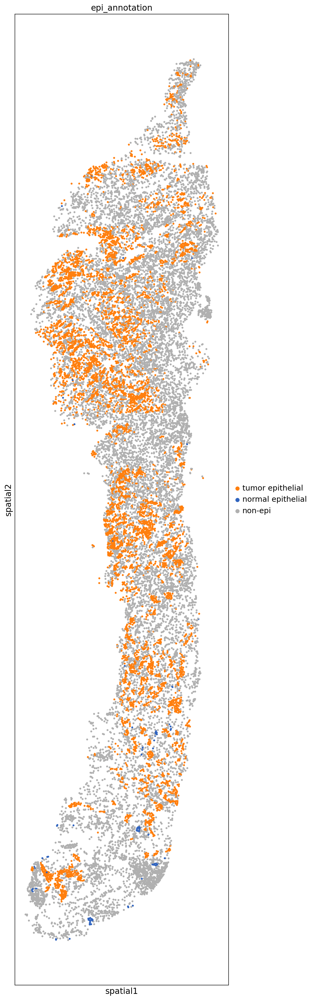

In [117]:
sc.pl.spatial(adata_1105_BL, color='epi_annotation', spot_size=13, save = "_epi_annotation_1105BL_allcells.png")

In [120]:
path = '/home/augusta/storage3/augusta/insituCNV/InSituCNV/Breast_cancer_Xenium5K/01_InSituCNV/for_xenium_explorer/1105_BL_epi_xenium_cell_groups_epi_annotation.csv'

adata_1105_BL.obs[['cell_id', 'epi_annotation']] \
    .rename(columns={'epi_annotation': 'group'}) \
    .to_csv(path, index=False)

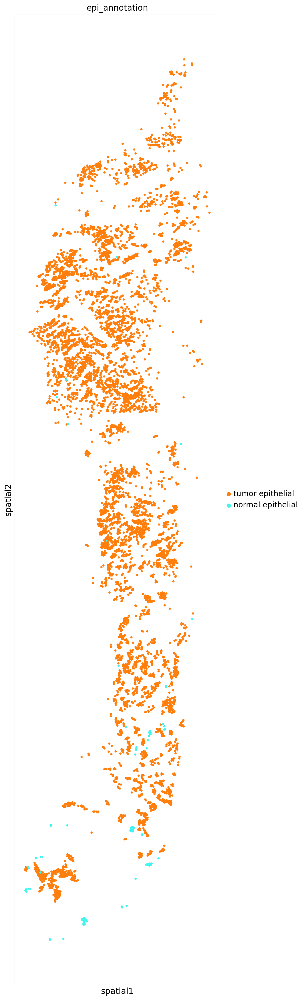

In [91]:
sc.pl.spatial(adata_1105_BL[adata_1105_BL.obs['cell_type_oct25'] == 'Epithelial'], color='epi_annotation', spot_size=15, save = "_epi_annotation_1105BL_epicells.png")

computing PCA
    with n_comps=50
    finished (0:00:00)
Storing dendrogram info using `.uns['dendrogram_epi_annotation']`
categories: tumor epithelial, normal epithelial, non-epi
var_group_labels: chr1, chr2, chr3, etc.


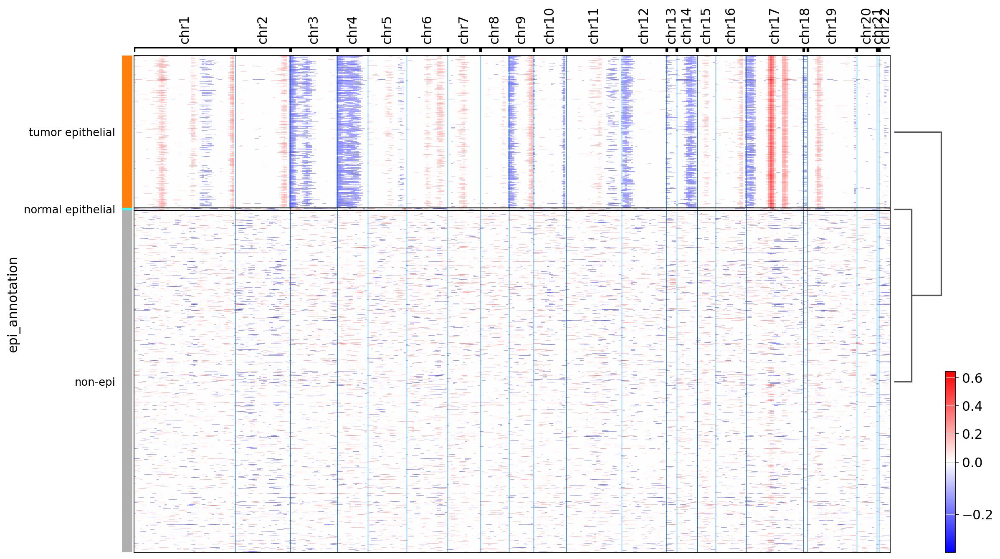

In [93]:
cnv.pl.chromosome_heatmap(adata_1105_BL, groupby='epi_annotation', dendrogram = True)

In [33]:
adata

AnnData object with n_obs × n_vars = 167264 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'leiden', 'cell.id', 'cell_type_oct25', 'compartment'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cell_type_oct25_colors', 'compartment_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap', 'cnv_leiden_res0.1_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'log_norm'